In [2]:
import numpy as np
import matplotlib.pyplot as plt 
import sklearn 
import sklearn.datasets
import sklearn.linear_model

# user defined
from planar_utils import plot_decision_boundary, sigmoid, load_planar_dataset, load_extra_datasets 
from testCases import * 

%matplotlib inline

np.random.seed(1) 

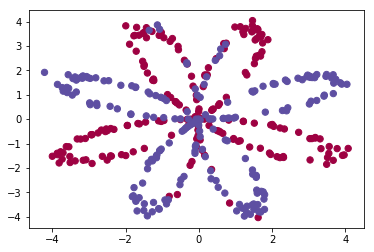

In [3]:
X, Y = load_planar_dataset()
plt.scatter(X[0, :], X[1, :],c=Y.ravel(), s=40, cmap=plt.cm.Spectral)

In [4]:
shape_X = X.shape # dimension (2, 400) 2 => x, y coordinations, # of sample
shape_Y = Y.shape # dimension (1, 400) 1 => label, # of sample
m = Y.shape[1]

print("X dimension: " + str(shape_X))
print("Y dimension: " + str(shape_Y))
print("train sample: " + str(m))

X dimension: (2, 400)
Y dimension: (1, 400)
train sample: 400


In [5]:
# generate LogisticRegressionCV Object, which implement a single neural network internally
clf = sklearn.linear_model.LogisticRegressionCV();

# Input and train data in this object
clf.fit(X.T, Y.T.ravel())

/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:2053: FutureWarning: You should specify a value for 'cv' instead of relying on the default value. The default value will change from 3 to 5 in version 0.22.
  warnings.warn(CV_WARNING, FutureWarning)


LogisticRegressionCV(Cs=10, class_weight=None, cv='warn', dual=False,
           fit_intercept=True, intercept_scaling=1.0, max_iter=100,
           multi_class='warn', n_jobs=None, penalty='l2',
           random_state=None, refit=True, scoring=None, solver='lbfgs',
           tol=0.0001, verbose=0)

prediction accuracy: 47 % 


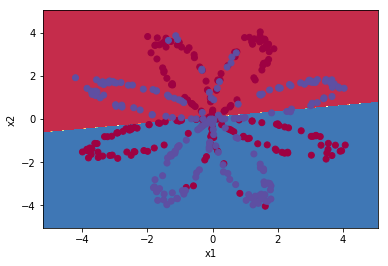

In [6]:
# use clf to predict
LR_predictions = clf.predict(X.T)

# print out accuracy of prediction
print ('prediction accuracy: %d ' % float((np.dot(Y, LR_predictions) + np.dot(1 - Y,1 - LR_predictions)) / float(Y.size) * 100) + '% ')
plot_decision_boundary(lambda x: clf.predict(x), X, Y.ravel())

In [13]:
# init w and b

def initialize_parameters(n_x, n_h, n_y):
    """
    param:
    n_x -- input layer neuro
    n_h -- hidden layer neuro
    n_y -- output layer neuro
    """
    
    np.random.seed(2)
    
    
    # randomly init hidden layer params
    # W1 dimension (n_h, n_x) (hidden layer #(e.g. X), input layer #(e.g. A))
    
    
    W1 = np.random.randn(n_h, n_x) *0.01 # multiple 0.01 to make w smaller to make gradient descent faster (e.g. 4, 2)
    
    # b1 dimension (n_h, 1) (hidden layer #, 1)
    b1 = np.zeros(shape=(n_h, 1))
    
    #inin sec layer
    W2 = np.random.randn(n_y, n_h) * 0.01
    b2 = np.zeros(shape=(n_y, 1))
    
    # store param
    parameters = {"W1": W1,
                  "b1": b1,
                  "W2": W2,
                  "b2": b2}
    
    return parameters

In [14]:
n_x, n_h, n_y = initialize_parameters_test_case()

parameters = initialize_parameters(n_x, n_h, n_y)
print("W1 = " + str(parameters["W1"]))
print("b1 = " + str(parameters["b1"]))
print("W2 = " + str(parameters["W2"]))
print("b2 = " + str(parameters["b2"]))

print("--------------------------------------------")

print("nn dim(" + str(n_x) + "," + str(n_h) + "," + str(n_y) + ")");
print("W1 dim:" + str(parameters["W1"].shape))
print("b1 dim:" + str(parameters["b1"].shape))
print("W2 dim:" + str(parameters["W2"].shape))
print("b2 dim:" + str(parameters["b2"].shape))

W1 = [[-0.00416758 -0.00056267]
 [-0.02136196  0.01640271]
 [-0.01793436 -0.00841747]
 [ 0.00502881 -0.01245288]]
b1 = [[0.]
 [0.]
 [0.]
 [0.]]
W2 = [[-0.01057952 -0.00909008  0.00551454  0.02292208]]
b2 = [[0.]]
--------------------------------------------
nn dim(2,4,1)
W1 dim:(4, 2)
b1 dim:(4, 1)
W2 dim:(1, 4)
b2 dim:(1, 1)


In [15]:
# forward propagation
def forward_propagation(X, parameters):
    """
    param:
    X -- input features, dim(x, y coords, # of sample)
    parameters -- w and b
    
    return:
    A2 -- The sigmoid output of the second activation
    cache -- a dict containing "Z1", "A1", "Z2" and "A2"
    """
    
    # get param
    W1 = parameters['W1']
    b1 = parameters['b1']
    W2 = parameters['W2']
    b2 = parameters['b2']
    
    # forward propagation
    Z1 = np.dot(W1, X) + b1
    A1 = np.tanh(Z1)
    Z2 = np.dot(W2, A1) + b2
    A2 = sigmoid(Z2)
    
    cache = {"Z1": Z1,
         "A1": A1,
         "Z2": Z2,
         "A2": A2}
    
    return A2, cache

In [16]:
X_assess, parameters = forward_propagation_test_case()

A2, cache = forward_propagation(X_assess, parameters)

print(np.mean(cache['Z1']), np.mean(cache['A1']), np.mean(cache['Z2']), np.mean(cache['A2']))

print("--------------------------------------------")

print("W1 dim:" + str(parameters["W1"].shape))
print("b1 dim:" + str(parameters["b1"].shape))
print("W2 dim:" + str(parameters["W2"].shape))
print("b2 dim:" + str(parameters["b2"].shape))

print("--------------------------------------------")

print("Z1 dim:" + str(cache['Z1'].shape))
print("A1 dim:" + str(cache['A1'].shape))
print("Z2 dim:" + str(cache['Z2'].shape))
print("A2 dim:" + str(cache['A2'].shape))

-0.0004997557777419902 -0.000496963353231779 0.00043818745095914653 0.500109546852431
--------------------------------------------
W1 dim:(4, 2)
b1 dim:(4, 1)
W2 dim:(1, 4)
b2 dim:(1, 1)
--------------------------------------------
Z1 dim:(4, 3)
A1 dim:(4, 3)
Z2 dim:(1, 3)
A2 dim:(1, 3)


In [17]:
def compute_cost(A2, Y, parameters):
    """
    param:
    A2 -- output layer
    Y -- label
    """
    m = Y.shape[1]
    logprobs = np.multiply(np.log(A2), Y) + np.multiply((1 - Y), np.log(1 - A2))
    cost = -np.sum(logprobs) / m
    return cost

In [18]:
A2, Y_assess, parameters = compute_cost_test_case()

print("cost = " + str(compute_cost(A2, Y_assess, parameters)))

cost = 0.6929198937761266


In [78]:
# backward propagatrion
def backward_propagation(parameters, cache, X, Y):
    """
    paramters -- w and b
    cache -- info from foward propagation
    X -- input features
    Y -- label
    """
    m = X.shape[1];
    
    W1 = parameters['W1']
    W2 = parameters['W2']
    A1 = cache['A1']
    A2 = cache['A2']
    
    dZ2 = A2 - Y
    dW2 = (1 / m) * np.dot(dZ2, A1.T)
    db2 = (1 / m) * np.sum(dZ2, axis=1, keepdims=True)
    dZ1 = np.multiply(np.dot(W2.T, dZ2), 1 - np.power(A1, 2))
    dW1 = (1 / m) * np.dot(dZ1, X.T)
    db1 = (1 / m) * np.sum(dZ1, axis=1, keepdims=True)
    
    print("W1 dim:" + str(W1.shape))
    print("W2 dim:" + str(W2.shape))
    print("------------------------------")
    
    print("dZ2 dim:" + str(dZ2.shape))
    print("dZ1 dim:" + str(dZ1.shape))
    print("------------------------------")
    
    grads = {"dW1": dW1,
             "db1": db1,
             "dW2": dW2,
             "db2": db2}
    
    return grads # 返回计算得到的梯度

In [79]:
# 单元测试
parameters, cache, X_assess, Y_assess = backward_propagation_test_case()

grads = backward_propagation(parameters, cache, X_assess, Y_assess)

print("dW1 dim:" + str(grads["dW1"].shape))
print("db1 dim:" + str(grads["db1"].shape))
print("dW2 dim:" + str(grads["dW2"].shape))
print("db2 dim:" + str(grads["db2"].shape))
print("------------------------------")

print ("dW1 = "+ str(grads["dW1"]))
print ("db1 = "+ str(grads["db1"]))
print ("dW2 = "+ str(grads["dW2"]))
print ("db2 = "+ str(grads["db2"]))

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
dW1 dim:(4, 2)
db1 dim:(4, 1)
dW2 dim:(1, 4)
db2 dim:(1, 1)
------------------------------
dW1 = [[ 0.01018708 -0.00708701]
 [ 0.00873447 -0.0060768 ]
 [-0.00530847  0.00369379]
 [-0.02206365  0.01535126]]
db1 = [[-0.00069728]
 [-0.00060606]
 [ 0.000364  ]
 [ 0.00151207]]
dW2 = [[ 0.00363613  0.03153604  0.01162914 -0.01318316]]
db2 = [[0.06589489]]


In [80]:
def update_parameters(parameters, grads, learning_rate=1.2):
    """
    param:
    parameters -- w和b 
    grads -- gradient
    """

    W1 = parameters['W1']
    b1 = parameters['b1']
    W2 = parameters['W2']
    b2 = parameters['b2']
    
    dW1 = grads['dW1']
    db1 = grads['db1']
    dW2 = grads['dW2']
    db2 = grads['db2']
    
    W1 = W1 - learning_rate * dW1
    b1 = b1 - learning_rate * db1
    W2 = W2 - learning_rate * dW2
    b2 = b2 - learning_rate * db2
    
    parameters = {"W1": W1,
                  "b1": b1,
                  "W2": W2,
                  "b2": b2}
    
    return parameters

In [81]:

parameters, grads = update_parameters_test_case()
parameters = update_parameters(parameters, grads)

print("W1 = " + str(parameters["W1"]))
print("b1 = " + str(parameters["b1"]))
print("W2 = " + str(parameters["W2"]))
print("b2 = " + str(parameters["b2"]))

W1 = [[-0.00643025  0.01936718]
 [-0.02410458  0.03978052]
 [-0.01653973 -0.02096177]
 [ 0.01046864 -0.05990141]]
b1 = [[-1.02420756e-06]
 [ 1.27373948e-05]
 [ 8.32996807e-07]
 [-3.20136836e-06]]
W2 = [[-0.01041081 -0.04463285  0.01758031  0.04747113]]
b2 = [[0.00010457]]


In [83]:
def nn_model(X, Y, n_h, num_iterations=10000, print_cost=False):
    """
    Arguments:
    X -- features
    Y -- label
    n_h # of neuro
    num_iterations
    print_cost
    """
    
    np.random.seed(3)
    n_x = X.shape[0]
    n_y = Y.shape[0]
    
    #init param
    parameters = initialize_parameters(n_x, n_h, n_y)
    W1 = parameters['W1']
    b1 = parameters['b1']
    W2 = parameters['W2']
    b2 = parameters['b2']
    
    # optimization
    for i  in range(0, num_iterations):
        # forward propagation
        A2, cache = forward_propagation(X, parameters) # A shape: (1, 400)
        
        # compute cost
        cost = compute_cost(A2, Y, parameters)
        
        # backward propagation
        grads = backward_propagation(parameters, cache, X, Y)
        
        # gradient descent
        parameters = update_parameters(parameters, grads)
        
        if print_cost and i % 1000 == 0:
            print ("after %i the training，cost: %f" % (i, cost))

    return parameters

In [84]:

X_assess, Y_assess = nn_model_test_case()

parameters = nn_model(X_assess, Y_assess, 4, num_iterations=10000, print_cost=False)
print("W1 = " + str(parameters["W1"]))
print("b1 = " + str(parameters["b1"]))
print("W2 = " + str(parameters["W2"]))
print("b2 = " + str(parameters["b2"]))

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log
  


W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
----------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 3)
dZ1 dim:(4, 3)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------

In [85]:
def predict(parameters, X):
    """
    param:
    parameters
    X
    """
    
    A2, cache = forward_propagation(X, parameters)
    predictions = np.round(A2)
    return predictions

In [86]:
# 单元测试
parameters, X_assess = predict_test_case()

predictions = predict(parameters, X_assess)
print("predictions mean = " + str(np.mean(predictions)))

predictions mean = 0.6666666666666666


W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
在训练0次后，成本是: 0.693048
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
在训练3000次后，成本是: 0.233864
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
---------------

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

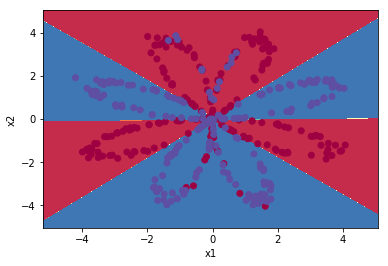

In [87]:
parameters = nn_model(X, Y, n_h = 4, num_iterations=10000, print_cost=True)
predictions = predict(parameters, X)
print ('precision: %d' % float((np.dot(Y, predictions.T) + np.dot(1 - Y, 1 - predictions.T)) / float(Y.size) * 100) + '%')
plot_decision_boundary(lambda x: predict(parameters, x.T), X, Y.ravel())

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:

dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(1, 2)
W2 dim:(1, 1)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(1, 400)
------------------------------
W1 dim:(

1 in hidden layer, accuracy: 67.5 %
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
---

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(

------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
--------

W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
W1 dim:(2, 2)
W2 dim:(1, 2)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(2, 400)
------------------------------
2 in hidden layer, accuracy: 67.25 %
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
--

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
--------

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(3, 2)
W2 dim:(1, 3)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(3, 400)
------------------------------
W1 dim:(

3 in hidden layer, accuracy: 90.75 %
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
--

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(4, 2)
W2 dim:(1, 4)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(4, 400)
------------------------------
W1 dim:(

4 in hidden layer, accuracy: 90.5 %
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
---

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(5, 2)
W2 dim:(1, 5)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(5, 400)
------------------------------
W1 dim:(

5 in hidden layer, accuracy: 91.25 %
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 4

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
------------------------------
W1 dim:(20, 2)
W2 dim:(1, 20)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(20, 400)
---------------

20 in hidden layer, accuracy: 90.5 %
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 4

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
------------------------------
W1 dim:(50, 2)
W2 dim:(1, 50)
------------------------------
dZ2 dim:(1, 400)
dZ1 dim:(50, 400)
---------------

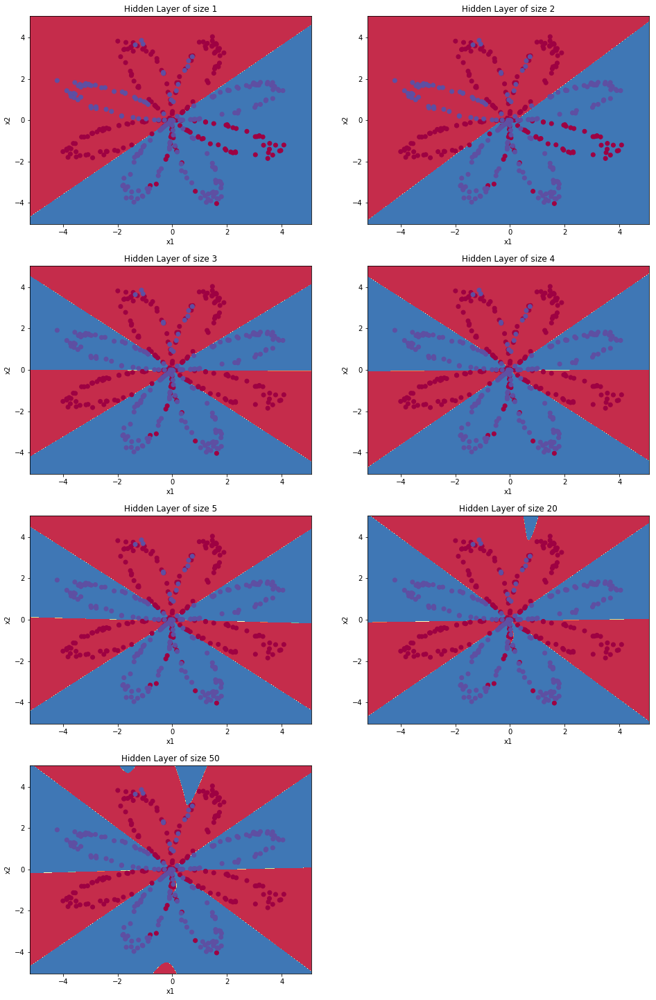

In [91]:
# test the accuracy when different # of nero used in hidden layer
plt.figure(figsize=(16, 32))
hidden_layer_sizes = [1, 2, 3, 4, 5, 20, 50] # 不同的神经元个数
for i, n_h in enumerate(hidden_layer_sizes):
    plt.subplot(5, 2, i + 1)
    plt.title('Hidden Layer of size %d' % n_h)
    parameters = nn_model(X, Y, n_h, num_iterations=5000)
    plot_decision_boundary(lambda x: predict(parameters, x.T), X, Y.ravel())
    predictions = predict(parameters, X)
    accuracy = float((np.dot(Y, predictions.T) + np.dot(1 - Y, 1 - predictions.T)) / float(Y.size) * 100)
    print ("{} in hidden layer, accuracy: {} %".format(n_h, accuracy))